# Convert a DECA 3D mesh to the colmap space

In [1]:
import os
import random
import numpy as np
import plotly.graph_objs as go
import cv2
from matplotlib import pyplot as plt
import torch
from PIL import Image
from tqdm import tqdm
import torchvision.transforms.functional as TF
import copy

/data/gpfs/projects/punim1485/kuoyuanl/anaconda3/envs/rignerf/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
root_dir = "./kuoyuan_home_glass"
rgb_path = os.path.join(root_dir, "rgb/ds")
deca_deform_path = os.path.join(root_dir, "deca_deform_out")
deca_canonical_path =  os.path.join(root_dir, "deca_canonical_out")
store_world_mesh_path = os.path.join(root_dir, "mesh_deformed")
colmap_dir = os.path.join(root_dir, "colmap")
filter_index_path = "./use_mesh_indexes.npy"
filter_index = np.load(filter_index_path)
visualize_mesh = True
test_mode = True

### Help function

In [3]:
def get_DECA_deform_mesh(image_id,filter_index=filter_index):
    deca_deformed_mesh_file = os.path.join(deca_deform_path, image_id,image_id+'_verts.txt')
    deca_deformed_mesh = [] # load mesh to a list as [(x1,y1,z1),(x2,y2,z2),...], each correspond to a point in 3D mesh
    with open(deca_deformed_mesh_file,"r") as mesh_file:
        lines = mesh_file.readlines()
        for line in lines:
            points = line.strip().split(" ")
            deca_deformed_mesh.append(points)
    deca_deformed_mesh = np.array(deca_deformed_mesh,dtype=np.float32)
    # remove meshes that are not useful
    deca_deformed_mesh = deca_deformed_mesh[filter_index]
    return deca_deformed_mesh

## Transform mesh between coordinates

In [4]:
def world2img_transform(mesh_deformed_world, w2c, K):
    # create camera intrinsic matrix
    mesh_deformed_world = torch.Tensor(mesh_deformed_world)
    # create camera extrinsic matrix
    extrinsic = torch.Tensor(copy.deepcopy(w2c)).float()
    results = []
    for mesh_point in mesh_deformed_world:
        mesh_point_exp = torch.cat([mesh_point, torch.ones([1])], dim=0)
        # transform the mesh to camera coordinate
        mesh_transformed_camera = torch.matmul(extrinsic, mesh_point_exp.T)
        # create the ones matrix
        ones = torch.Tensor([[1, 0, 0, 0],[0, 1, 0, 0],[0, 0, 1, 0]]).float()
        mesh_camera = torch.matmul(ones, mesh_transformed_camera)
        #mesh_camera_results.append(mesh_camera)
        pixels = torch.matmul(K, mesh_camera)
        results.append(pixels)
    results = torch.stack(results).float()
    results = results/results[:, 2, None]
    results = results.long()
    return results
    

In [5]:
def world2cam(mesh,w2c):
    mesh = torch.Tensor(mesh)
    mesh = torch.cat([mesh, torch.ones([mesh.shape[0], 1])], dim=1)
    # create camera extrinsic matrix
    extrinsic = torch.Tensor(copy.deepcopy(w2c)).float()
    results = torch.matmul(extrinsic, mesh.T).T
    results = results[:, :3]
    return results

In [6]:
def calculateScaleZTranslation(mesh1,mesh2):
    # mesh 1 is the mesh in camera coordinate, mesh 2 is the deca mesh
    # calculate the scale and translation between two meshes
    mesh1 = torch.Tensor(mesh1)
    mesh2 = torch.Tensor(mesh2)
    mesh1_cp = copy.deepcopy(mesh1)
    mesh2_cp = copy.deepcopy(mesh2)
    # calculate the scale on x and y axis
    scale_x = torch.mean(mesh1_cp[:,0]/(mesh2_cp[:,0]))
    scale_y = torch.mean(mesh1_cp[:,1]/(mesh2_cp[:,1]))
    scale = min(scale_x,scale_y)
    # calculate the translation after scale
    mesh2_cp[:,0] = mesh2_cp[:,0]*scale
    mesh2_cp[:,1] = mesh2_cp[:,1]*scale
    mesh2_cp[:,2] = mesh2_cp[:,2]*scale
    translation_z = torch.mean(mesh1_cp[:,2]-mesh2_cp[:,2])
    return scale,translation_z


In [7]:
def transformDecaMeshToCam(deca_mesh,scale,translation_z):
    # translate the z-axis of deca mesh
    result_mesh = copy.deepcopy(deca_mesh)
    # scale the deca mesh
    result_mesh[:,0] = result_mesh[:,0]*scale
    result_mesh[:,1] = result_mesh[:,1]*scale
    result_mesh[:,2] = result_mesh[:,2]*scale
    result_mesh[:,2] = result_mesh[:,2] + translation_z
    return result_mesh

In [8]:
def cam2world(cam_mesh,w2c):
    # convert w2c matrix to c2w matrix by inverse rotation and translation
    c2w = torch.linalg.inv(w2c)
    result_mesh = copy.deepcopy(cam_mesh)
    # apply the c2w matrix to the mesh
    result_mesh = torch.cat([result_mesh, torch.ones([result_mesh.shape[0], 1])], dim=1)
    results = torch.matmul(c2w, result_mesh.T).T
    results = results[:, :3]
    return results

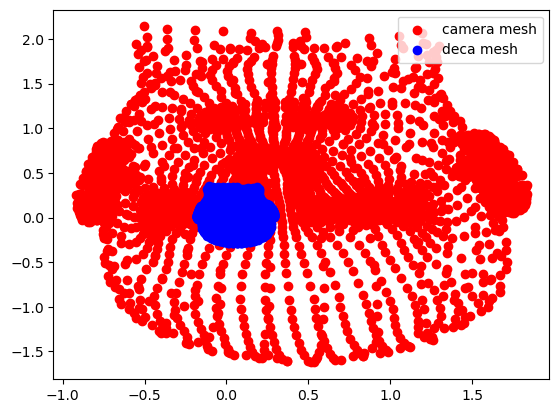

In [9]:
# load camera data (W,H,focal,cx,cy) from .bin file
from nsrpl.colmap_utils import read_images_binary, read_cameras_binary
# load image data (pose(qvec, tvec), name (used for loading images and masks))
imdata = read_images_binary(os.path.join(colmap_dir, 'sparse/0/images.bin'))

# use p3_000000.png as the reference image to calculate the transformation
ref_image_name = "p3_000000"
scale,translation_z = None,None
for i, d in enumerate(imdata.values()):
    image_name = d.name.split('.')[0] # px_00xxxx
    if image_name != ref_image_name:
        continue
    
    # get world to camera matrix
    R = d.qvec2rotmat()
    t = d.tvec.reshape(3, 1)
    w2c = np.concatenate([R,t], axis=1)
    w2c = np.concatenate([w2c,[[0,0,0,1]]],axis = 0)
    w2c = torch.Tensor(w2c).float()    
    
    # load deca mesh
    deca_mesh = get_DECA_deform_mesh(image_name)
    deca_mesh = torch.Tensor(deca_mesh).float()
    # load world mesh
    if not os.path.exists(os.path.join(root_dir, "mesh_canonical/canonical_mesh_colmap_coordinate.npy")):
        world_mesh = np.load(os.path.join(root_dir, "mesh_canonical/canonical_mesh_colmap_coordinate_5023.npy"))
        world_mesh = world_mesh[filter_index]
        np.save(os.path.join(root_dir, "mesh_canonical/canonical_mesh_colmap_coordinate.npy"),world_mesh)
    else:
        world_mesh = np.load(os.path.join(root_dir, "mesh_canonical/canonical_mesh_colmap_coordinate.npy"))
    world_mesh = torch.Tensor(world_mesh).float()
    # get the camera mesh
    cam_mesh = world2cam(world_mesh,w2c)
    
    if visualize_mesh:
        # plot the 2d of the camera mesh and deca mesh
        cam_mesh_2d = cam_mesh[:,0:2].numpy()
        deca_mesh_2d = deca_mesh[:,0:2].numpy()
        # plot the 2d points 
        fig, ax = plt.subplots()
        ax.scatter(cam_mesh_2d[:,0], cam_mesh_2d[:,1], c='r', label='camera mesh')
        ax.scatter(deca_mesh_2d[:,0], deca_mesh_2d[:,1], c='b', label='deca mesh')
        ax.legend()
        plt.show()

    # calculate the scale and translation between two meshes
    scale,translation_z = calculateScaleZTranslation(cam_mesh,deca_mesh)
    
    if test_mode:
        applied_transformed_mesh = transformDecaMeshToCam(deca_mesh,scale,translation_z)
        applied_world_mesh = cam2world(applied_transformed_mesh,w2c)
        # plot the transformed mesh
        fig = go.Figure()
        fig.add_trace(go.Scatter3d(
            x=applied_transformed_mesh[:, 0],
            y=applied_transformed_mesh[:, 1],
            z=applied_transformed_mesh[:, 2],
            mode='markers',
            marker=dict(size=2),
        ))
        fig.add_trace(go.Scatter3d(
            x=cam_mesh[:, 0],
            y=cam_mesh[:, 1],
            z=cam_mesh[:, 2],
            mode='markers',
            marker=dict(size=2),
        ))  

        fig.add_trace(go.Scatter3d(
            x=deca_mesh[:, 0],
            y=deca_mesh[:, 1],
            z=deca_mesh[:, 2],
            mode='markers',
            marker=dict(size=2),
        ))  
        fig.add_trace(go.Scatter3d(
            x=applied_world_mesh[:, 0],
            y=applied_world_mesh[:, 1],
            z=applied_world_mesh[:, 2],
            mode='markers',
            marker=dict(size=2),
        ))
        fig.add_trace(go.Scatter3d(
            x=world_mesh[:, 0],
            y=world_mesh[:, 1],
            z=world_mesh[:, 2],
            mode='markers',
            marker=dict(size=2),
        )) 
        fig.update_layout(scene_dragmode='orbit')
        fig.show()
    break
assert scale is not None and translation_z is not None

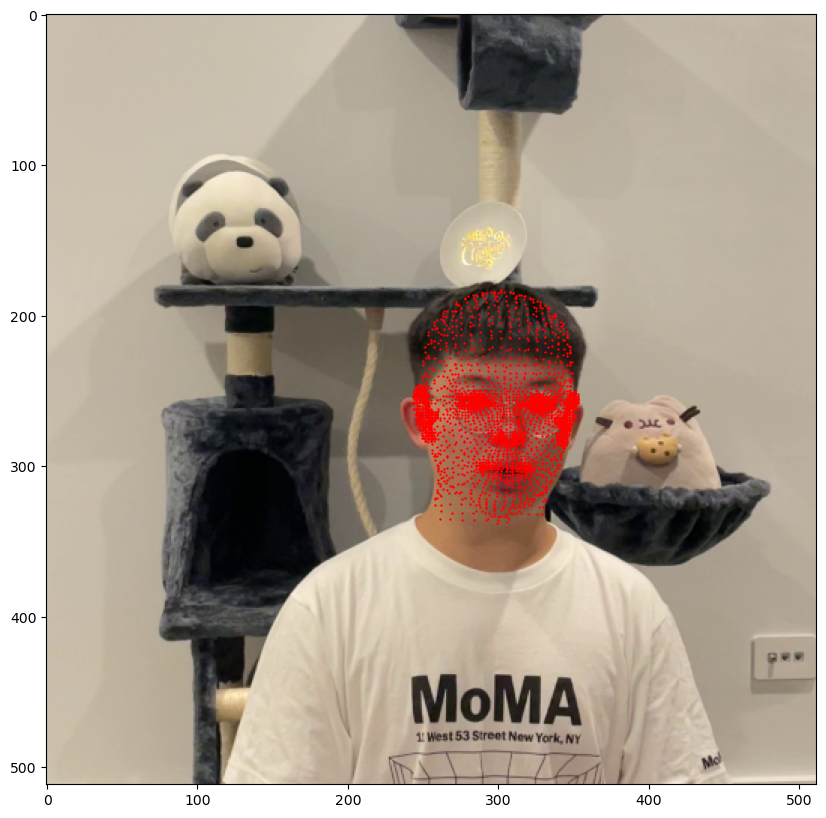

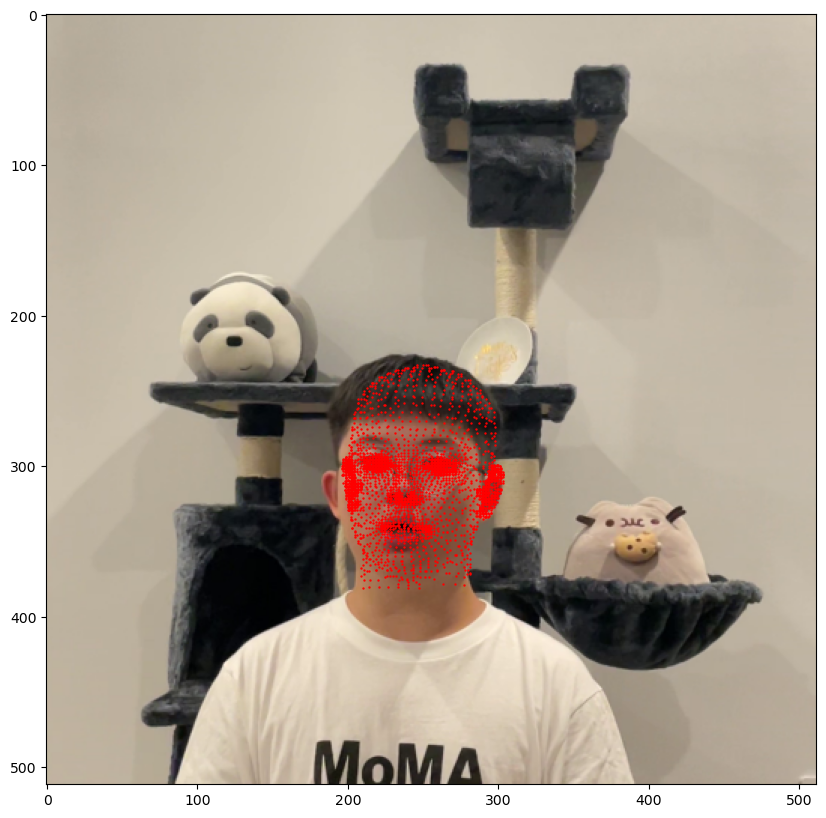

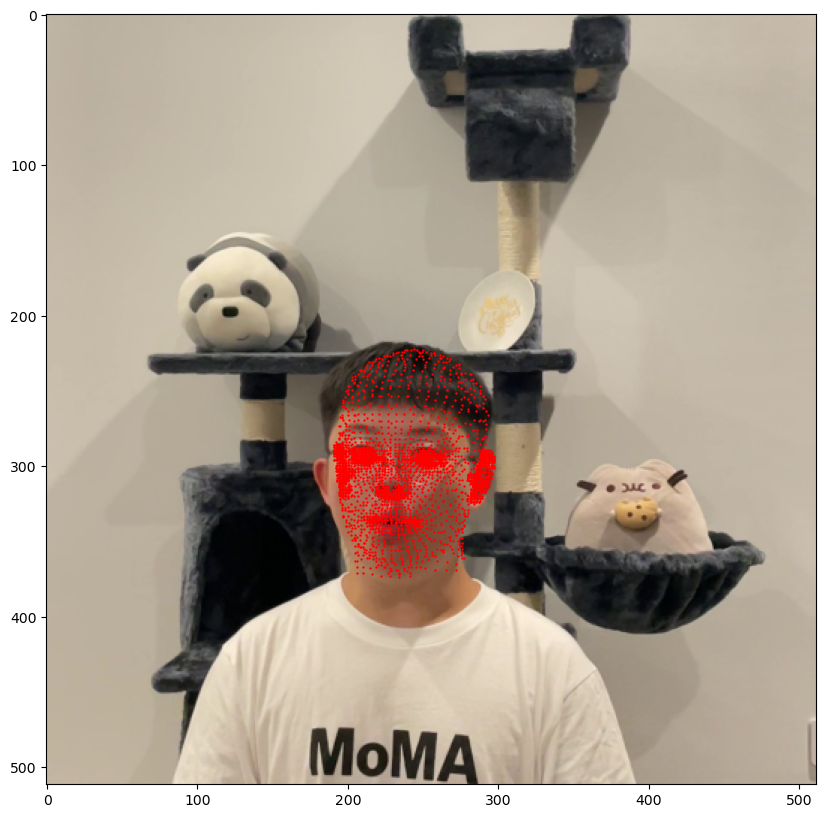

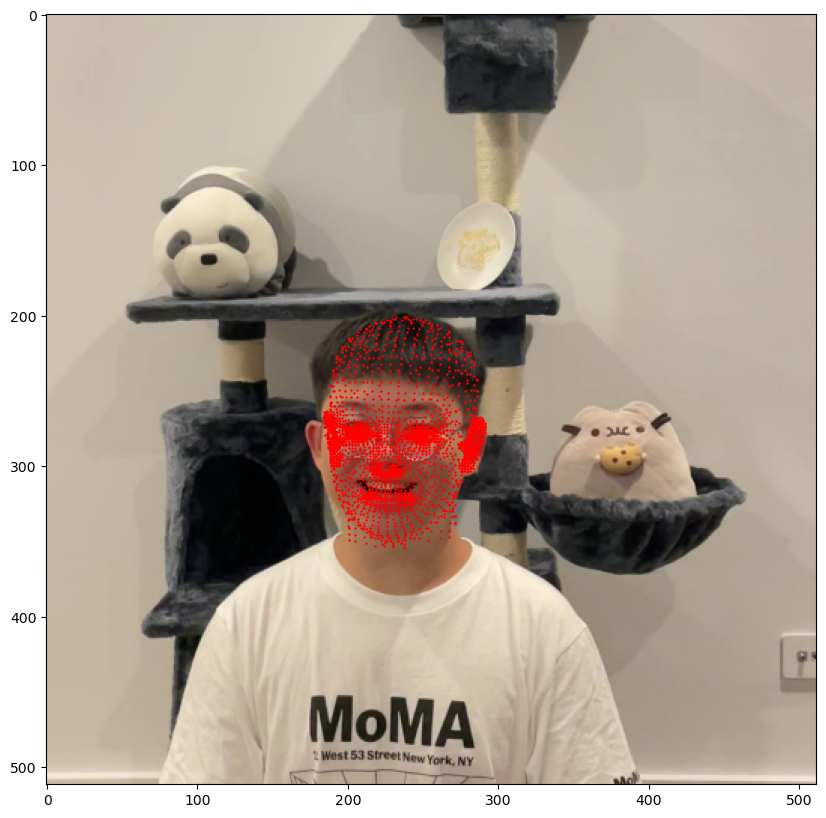

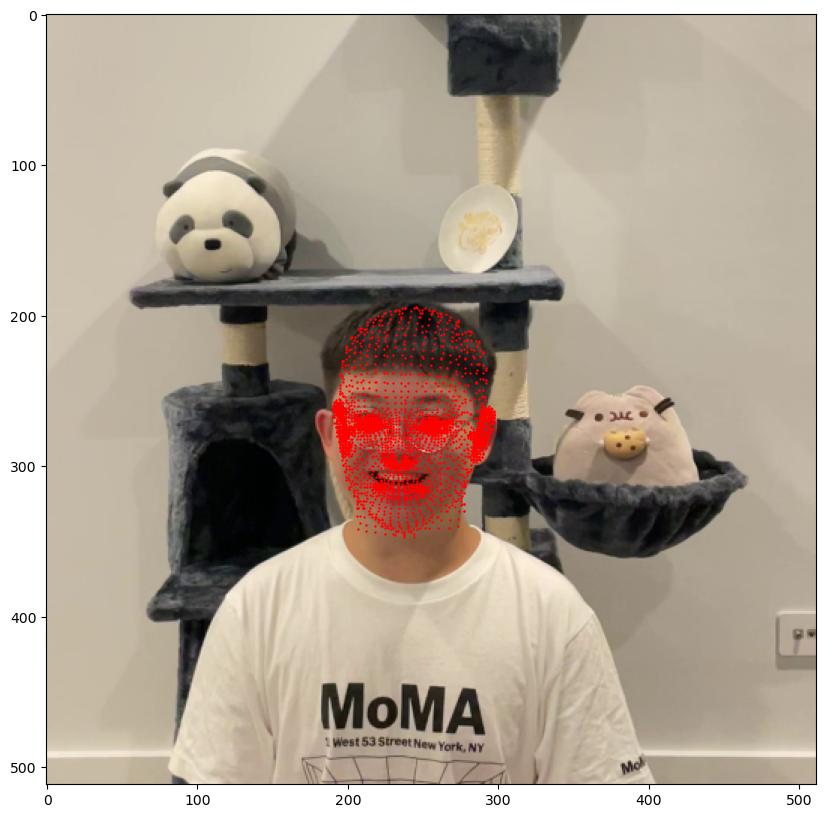

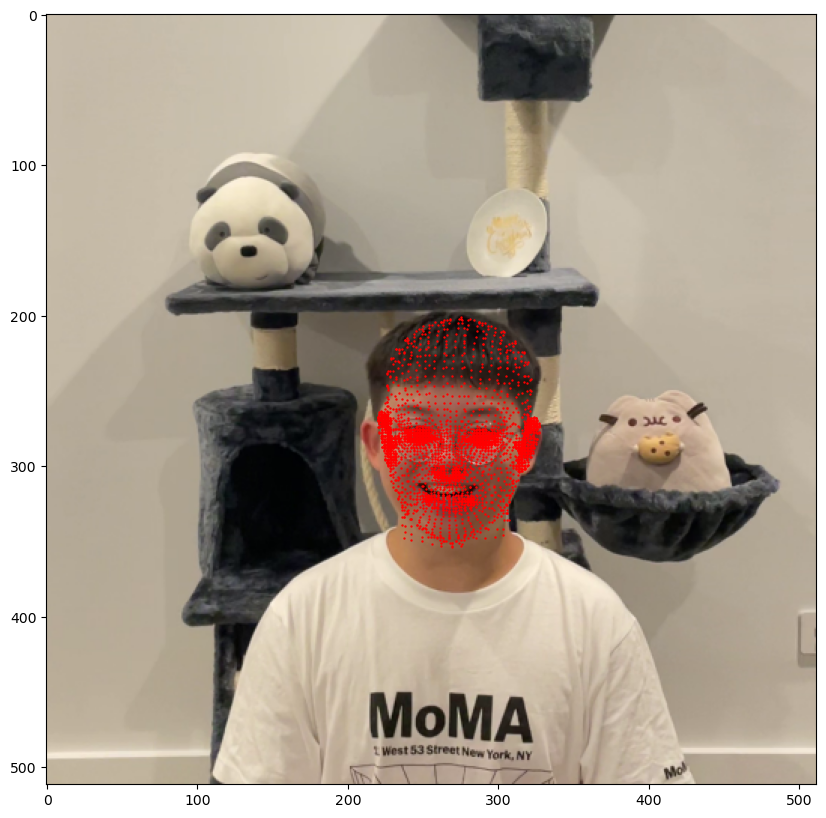

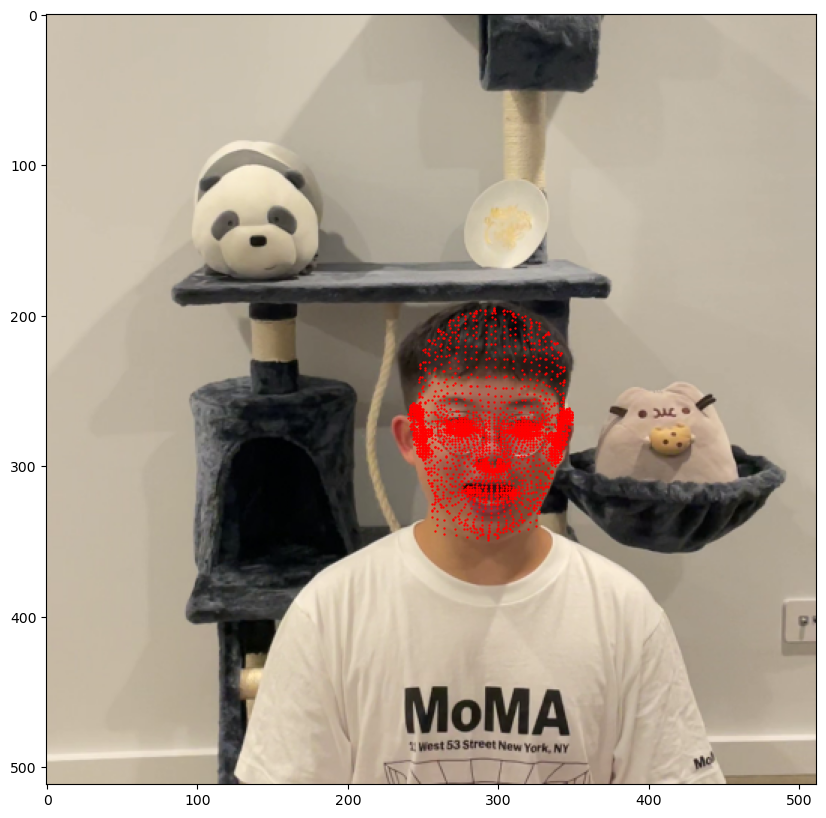

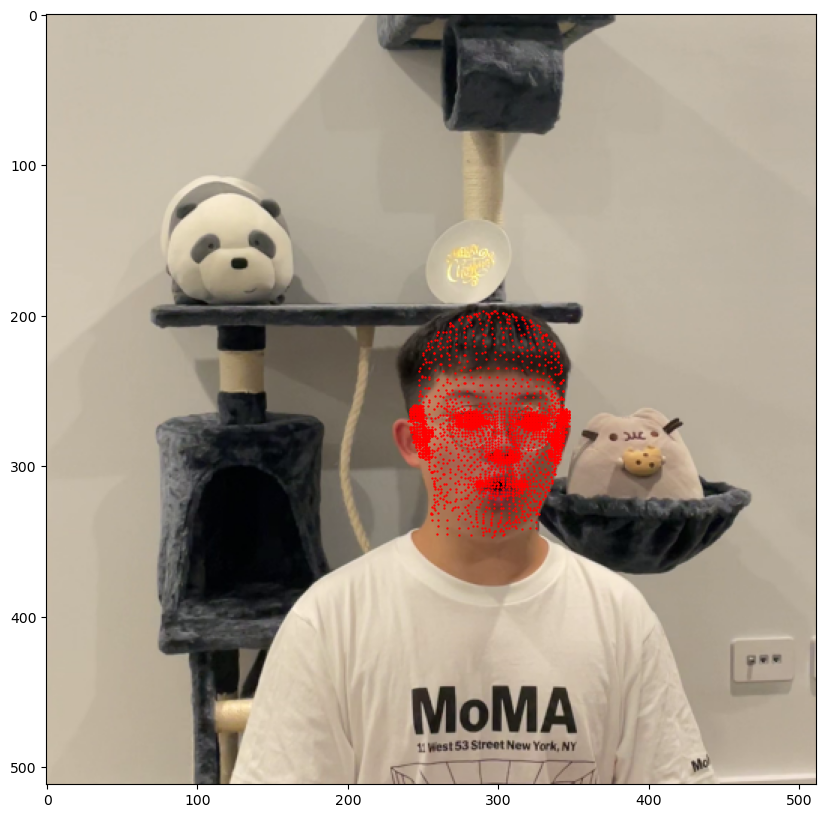

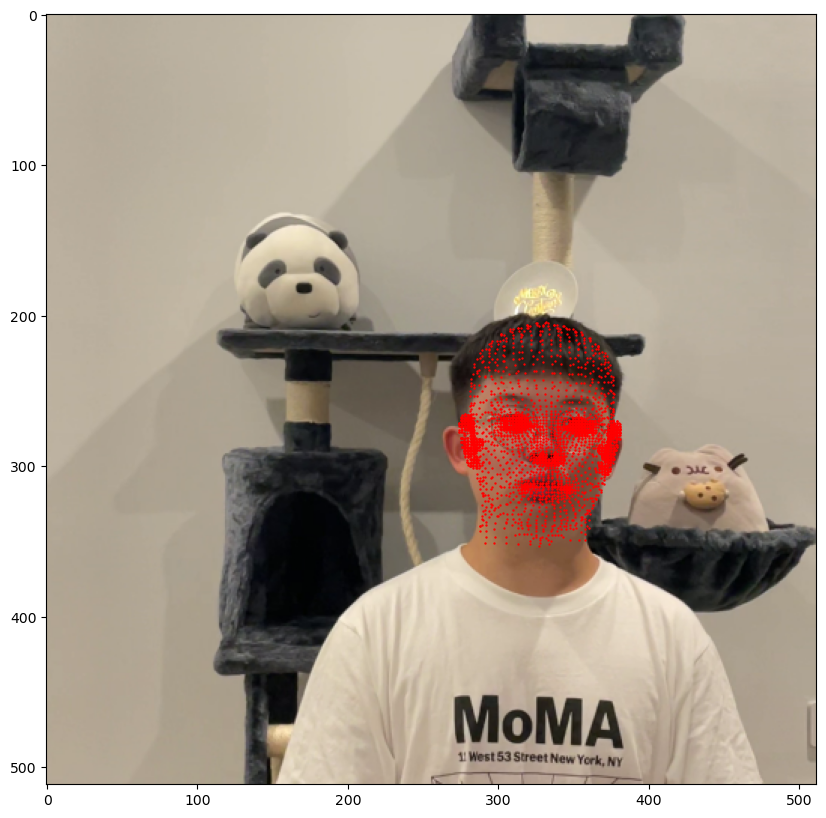

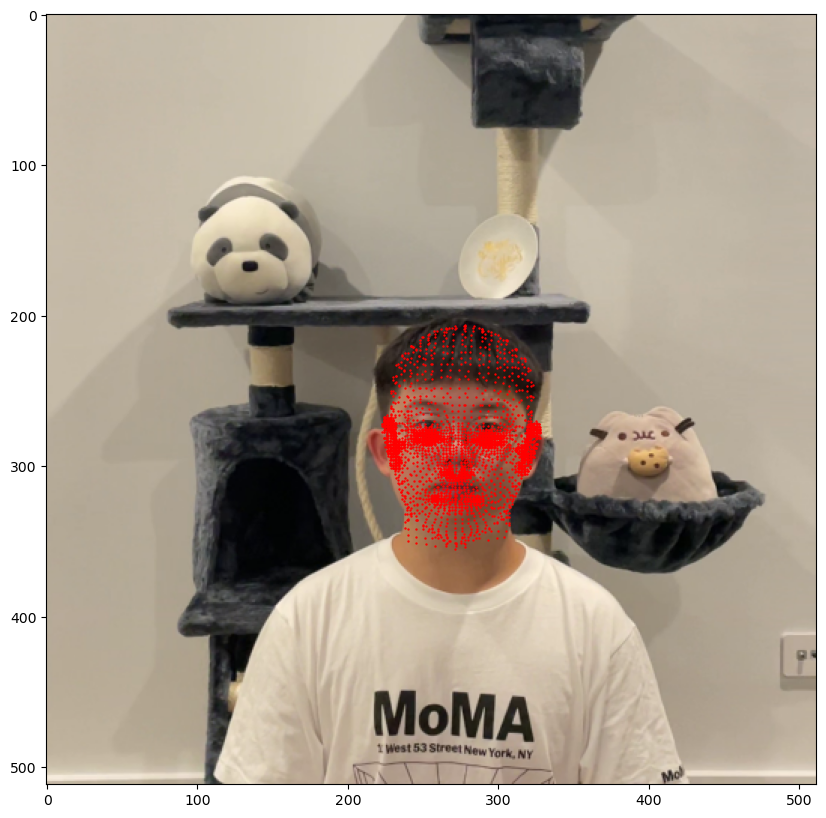

In [15]:
if test_mode:
    pick_num = 10
    assert scale is not None and translation_z is not None
    # randomly pick 10 images to test
    meshes = []
    # get camera intrinsic matrix
    camdata = read_cameras_binary(os.path.join(colmap_dir, 'sparse/0/cameras.bin'))
    if camdata[1].model == 'SIMPLE_RADIAL':
        fx = fy = camdata[1].params[0]  # focal length
        cx = camdata[1].params[1]  # principal point
        cy = camdata[1].params[2]
    elif camdata[1].model in ['PINHOLE', 'OPENCV']:
        fx = camdata[1].params[0] 
        fy = camdata[1].params[1] 
        cx = camdata[1].params[2] 
        cy = camdata[1].params[3] 
    else:
        raise ValueError(f"Please parse the intrinsics for camera model {camdata[1].model}!")
    K = torch.Tensor([[fx, 0, cx], [0, fy, cy], [0, 0, 1]]).float()

    for i, d in enumerate(imdata.values()):
        image_name = d.name.split('.')[0] # px_00xxxx
        if not image_name.startswith(tuple(["p2"])):
            continue
        
        # determine if we should use this image by random (10% chance)
        if random.random() > 0.005:
            continue
        
        # get world to camera matrix
        R = d.qvec2rotmat()
        t = d.tvec.reshape(3, 1)
        w2c = np.concatenate([R,t], axis=1)
        w2c = np.concatenate([w2c,[[0,0,0,1]]],axis = 0)
        w2c = torch.Tensor(w2c).float()    
     
        # load deca mesh
        deca_mesh = get_DECA_deform_mesh(image_name)
        deca_mesh = torch.Tensor(deca_mesh).float()
#         transformed_world_mesh = np.load(os.path.join(root_dir, "mesh_canonical/canonical_mesh_colmap_coordinate.npy"))
#         # convert deca mesh to camera mesh
        transformed_cam_mesh = transformDecaMeshToCam(deca_mesh,scale,translation_z)
#         # convert camera mesh to world mesh
        transformed_world_mesh = cam2world(transformed_cam_mesh,w2c)
        
        meshes.append(transformed_world_mesh)

        # project the calculated transformed mesh to image
        mesh_img = world2img_transform(transformed_world_mesh, w2c, K)
        # load the image
        img = Image.open(os.path.join(rgb_path, image_name+".png"))
        img = TF.to_tensor(img).permute(1, 2, 0)[...,:3]
        # plot the image and mesh
        fig = plt.figure(figsize=(10, 10))
        plt.imshow(img)
        plt.scatter(mesh_img[:, 0], mesh_img[:, 1], c='r', s=0.5)
        plt.show()
                    
        if len(meshes) > pick_num:
            break
    
    print("plot the transformed mesh and world canonical mesh for all {} images".format(len(meshes)))    
    # plot the transformed mesh and world canonical mesh
    world_mesh = np.load(os.path.join(root_dir, "mesh_canonical/canonical_mesh_colmap_coordinate.npy"))
    fig = go.Figure()
    for mesh in meshes:
        fig.add_trace(go.Scatter3d(
            x=mesh[:, 0],
            y=mesh[:, 1],
            z=mesh[:, 2],
            mode='markers',
            marker=dict(size=2),
        ))
    fig.add_trace(go.Scatter3d(
        x=world_mesh[:, 0],
        y=world_mesh[:, 1],
        z=world_mesh[:, 2],
        mode='markers',
        marker=dict(size=2),
    )) 
    fig.update_layout(scene_dragmode='orbit')
    fig.show()

## Apply transformation for all frames (or only for part 3)

In [ ]:
part3_only = False
for i, d in enumerate(tqdm(imdata.values())):
    image_name = d.name.split('.')[0] # px_00xxxx
    if part3_only:
        if not image_name.startswith(tuple(["p3"])):
            continue
    else:
        if not image_name.startswith(tuple(["p3","p2"])):
            continue

    # get world to camera matrix
    R = d.qvec2rotmat()
    t = d.tvec.reshape(3, 1)
    w2c = np.concatenate([R,t], axis=1)
    w2c = np.concatenate([w2c,[[0,0,0,1]]],axis = 0)
    w2c = torch.Tensor(w2c).float()    

    # load deca mesh
    deca_mesh = get_DECA_deform_mesh(image_name)
    deca_mesh = torch.Tensor(deca_mesh).float()

    # convert deca mesh to camera mesh
    transformed_cam_mesh = transformDecaMeshToCam(deca_mesh,scale,translation_z)
    # convert camera mesh to world mesh
    transformed_world_mesh = cam2world(transformed_cam_mesh,w2c)
    
    # store
    store_path = os.path.join(store_world_mesh_path,image_name+"_mesh_colmap_coordinate.npy")
    np.save(store_path,transformed_world_mesh)

 66%|██████▌   | 1788/2726 [00:42<00:29, 31.91it/s] 

### if part 3 only, use old method (transformation based on triangulated mesh and deca no expression mesh)

In [13]:
# Similarity transformation
# Based on https://github.com/mapillary/OpenSfM/blob/61a98f6ab0f2d7b12592a92436648bd276f603d8/opensfm/transformations.py#L883
import math
_EPS = np.finfo(float).eps * 4.0

def quaternion_matrix(quaternion):
    """Return homogeneous rotation matrix from quaternion.
    >>> M = quaternion_matrix([0.99810947, 0.06146124, 0, 0])
    >>> np.allclose(M, rotation_matrix(0.123, [1, 0, 0]))
    True
    >>> M = quaternion_matrix([1, 0, 0, 0])
    >>> np.allclose(M, np.identity(4))
    True
    >>> M = quaternion_matrix([0, 1, 0, 0])
    >>> np.allclose(M, np.diag([1, -1, -1, 1]))
    True
    """
    q = np.array(quaternion, dtype=np.float64, copy=True)
    n = np.dot(q, q)
    if n < _EPS:
        return np.identity(4)
    q *= math.sqrt(2.0 / n)
    q = np.outer(q, q)
    return np.array([
        [1.0-q[2, 2]-q[3, 3],     q[1, 2]-q[3, 0],     q[1, 3]+q[2, 0], 0.0],
        [    q[1, 2]+q[3, 0], 1.0-q[1, 1]-q[3, 3],     q[2, 3]-q[1, 0], 0.0],
        [    q[1, 3]-q[2, 0],     q[2, 3]+q[1, 0], 1.0-q[1, 1]-q[2, 2], 0.0],
        [                0.0,                 0.0,                 0.0, 1.0]])

def vector_norm(data, axis=None, out=None):
    """Return length, i.e. Euclidean norm, of ndarray along axis.
    >>> v = np.random.random(3)
    >>> n = vector_norm(v)
    >>> np.allclose(n, np.linalg.norm(v))
    True
    >>> v = np.random.rand(6, 5, 3)
    >>> n = vector_norm(v, axis=-1)
    >>> np.allclose(n, np.sqrt(np.sum(v*v, axis=2)))
    True
    >>> n = vector_norm(v, axis=1)
    >>> np.allclose(n, np.sqrt(np.sum(v*v, axis=1)))
    True
    >>> v = np.random.rand(5, 4, 3)
    >>> n = np.empty((5, 3))
    >>> vector_norm(v, axis=1, out=n)
    >>> np.allclose(n, np.sqrt(np.sum(v*v, axis=1)))
    True
    >>> vector_norm([])
    0.0
    >>> vector_norm([1])
    1.0
    """
    data = np.array(data, dtype=np.float64, copy=True)
    if out is None:
        if data.ndim == 1:
            return math.sqrt(np.dot(data, data))
        data *= data
        out = np.atleast_1d(np.sum(data, axis=axis))
        np.sqrt(out, out)
        return out
    else:
        data *= data
        np.sum(data, axis=axis, out=out)
        np.sqrt(out, out)

        
def affine_matrix_from_points(v0, v1, shear=False, scale=True, usesvd=False):
    """Return affine transform matrix to register two point sets.
    v0 and v1 are shape (ndims, \*) arrays of at least ndims non-homogeneous
    coordinates, where ndims is the dimensionality of the coordinate space.
    If shear is False, a similarity transformation matrix is returned.
    If also scale is False, a rigid/Euclidean transformation matrix
    is returned.
    By default the algorithm by Hartley and Zissermann [15] is used.
    If usesvd is True, similarity and Euclidean transformation matrices
    are calculated by minimizing the weighted sum of squared deviations
    (RMSD) according to the algorithm by Kabsch [8].
    Otherwise, and if ndims is 3, the quaternion based algorithm by Horn [9]
    is used, which is slower when using this Python implementation.
    The returned matrix performs rotation, translation and uniform scaling
    (if specified).
    >>> np.set_printoptions(precision=5, suppress=True)
    >>> v0 = [[0, 1031, 1031, 0], [0, 0, 1600, 1600]]
    >>> v1 = [[675, 826, 826, 677], [55, 52, 281, 277]]
    >>> affine_matrix_from_points(v0, v1)
    array([[   0.14549,    0.00062,  675.50008],
           [   0.00048,    0.14094,   53.24971],
           [   0.     ,    0.     ,    1.     ]])
    >>> T = translation_matrix(np.random.random(3)-0.5)
    >>> R = random_rotation_matrix(np.random.random(3))
    >>> S = scale_matrix(np.random.random())
    >>> M = concatenate_matrices(T, R, S)
    >>> v0 = (np.random.rand(4, 100) - 0.5) * 20
    >>> v0[3] = 1
    >>> v1 = np.dot(M, v0)
    >>> v0[:3] += np.random.normal(0, 1e-8, 300).reshape(3, -1)
    >>> M = affine_matrix_from_points(v0[:3], v1[:3])
    >>> np.allclose(v1, np.dot(M, v0))
    True
    More examples in superimposition_matrix()
    """
    # Make [[x1,y1,z1],[x2,y2,z2]] to [[x1,x2],[y1,y2],[z1,z2]]
    v0 = np.array(v0.T, dtype=np.float64, copy=True)
    v1 = np.array(v1.T, dtype=np.float64, copy=True)

    ndims = v0.shape[0]
    if ndims < 2 or v0.shape[1] < ndims or v0.shape != v1.shape:
        raise ValueError("input arrays are of wrong shape or type")

    # move centroids to origin
    t0 = -np.mean(v0, axis=1)
    M0 = np.identity(ndims+1)
    M0[:ndims, ndims] = t0
    v0 += t0.reshape(ndims, 1)
    t1 = -np.mean(v1, axis=1)
    M1 = np.identity(ndims+1)
    M1[:ndims, ndims] = t1
    v1 += t1.reshape(ndims, 1)

    if shear:
        # Affine transformation
        A = np.concatenate((v0, v1), axis=0)
        u, s, vh = np.linalg.svd(A.T)
        vh = vh[:ndims].T
        B = vh[:ndims]
        C = vh[ndims:2*ndims]
        t = np.dot(C, np.linalg.pinv(B))
        t = np.concatenate((t, np.zeros((ndims, 1))), axis=1)
        M = np.vstack((t, ((0.0,)*ndims) + (1.0,)))
    elif usesvd or ndims != 3:
        # Rigid transformation via SVD of covariance matrix
        u, s, vh = np.linalg.svd(np.dot(v1, v0.T))
        # rotation matrix from SVD orthonormal bases
        R = np.dot(u, vh)
        if np.linalg.det(R) < 0.0:
            # R does not constitute right handed system
            R -= np.outer(u[:, ndims-1], vh[ndims-1, :]*2.0)
            s[-1] *= -1.0
        # homogeneous transformation matrix
        M = np.identity(ndims+1)
        M[:ndims, :ndims] = R
    else:
        # Rigid transformation matrix via quaternion
        # compute symmetric matrix N
        xx, yy, zz = np.sum(v0 * v1, axis=1)
        xy, yz, zx = np.sum(v0 * np.roll(v1, -1, axis=0), axis=1)
        xz, yx, zy = np.sum(v0 * np.roll(v1, -2, axis=0), axis=1)
        N = [[xx+yy+zz, 0.0,      0.0,      0.0],
             [yz-zy,    xx-yy-zz, 0.0,      0.0],
             [zx-xz,    xy+yx,    yy-xx-zz, 0.0],
             [xy-yx,    zx+xz,    yz+zy,    zz-xx-yy]]
        # quaternion: eigenvector corresponding to most positive eigenvalue
        w, V = np.linalg.eigh(N)
        q = V[:, np.argmax(w)]
        q /= vector_norm(q)  # unit quaternion
        # homogeneous transformation matrix
        M = quaternion_matrix(q)

    if scale and not shear:
        # Affine transformation; scale is ratio of RMS deviations from centroid
        v0 *= v0
        v1 *= v1
        M[:ndims, :ndims] *= math.sqrt(np.sum(v1) / np.sum(v0))

    # move centroids back
    M = np.dot(np.linalg.inv(M1), np.dot(M, M0))
    M /= M[ndims, ndims]
    return M

In [14]:
# if part 3 only, use old method (transformation based on triangulated mesh and deca no expression mesh)
def get_DECA_canonical_mesh(image_id, filter_index=filter_index):
    deca_canonical_mesh_file = os.path.join(deca_canonical_path, image_id,image_id+'_verts.txt')
    deca_canonical_mesh = [] # load mesh to a list as [(x1,y1,z1),(x2,y2,z2),...], each correspond to a point in 3D mesh
    with open(deca_canonical_mesh_file,"r") as mesh_file:
        lines = mesh_file.readlines()
        for line in lines:
            points = line.strip().split(" ")
            deca_canonical_mesh.append(points)
    deca_canonical_mesh = np.array(deca_canonical_mesh,dtype=np.float32)
    deca_canonical_mesh = deca_canonical_mesh[filter_index]
    return deca_canonical_mesh

In [ ]:
def coordinate_transformation(colmap_mesh,canonical_mesh,deformed_mesh):
    # the transformation should be a similarity transformation
    # Similarity transformation includes translation, rotation and isotropic Scaling
    transformation = affine_matrix_from_points(canonical_mesh,colmap_mesh)
    z = np.ones((deformed_mesh.shape[0],1), dtype=float)
    deformed_mesh = np.append(deformed_mesh, z, axis=1)
    deformed_transform = np.array([np.matmul(transformation,row) for row in deformed_mesh])
    return deformed_transform[:,:3]

if part3_only:  
    print("Generate part 2 image using old method")
    colmap_mesh_point = np.load(os.path.join(root_dir, "mesh_canonical/canonical_mesh_colmap_coordinate.npy"))
    for i, d in enumerate(tqdm(imdata.values())):
        image_name = d.name.split('.')[0] # px_00xxxx
        if not image_name.startswith('p2'):
            continue
        deca_deformed_mesh = get_DECA_deform_mesh(image_name)
        deca_canonical_mesh = get_DECA_canonical_mesh(image_name)
        # show these two mesh:
#         fig = go.Figure()
#         fig.add_trace(go.Scatter3d(
#             x=deca_deformed_mesh[:, 0],
#             y=deca_deformed_mesh[:, 1],
#             z=deca_deformed_mesh[:, 2],
#             mode='markers',
#             marker=dict(size=2),
#         ))
#         fig.add_trace(go.Scatter3d(
#             x=deca_canonical_mesh[:, 0],
#             y=deca_canonical_mesh[:, 1],
#             z=deca_canonical_mesh[:, 2],
#             mode='markers',
#             marker=dict(size=2),
#         ))  
#         fig.update_layout(scene_dragmode='orbit')
#         fig.show()
        deformed_transform = coordinate_transformation(colmap_mesh_point,deca_canonical_mesh,deca_deformed_mesh)
        deca_deformed_transformed_file =  os.path.join(store_world_mesh_path,image_name+"_mesh_colmap_coordinate.npy")
        np.save(deca_deformed_transformed_file,deformed_transform)

 26%|██▌       | 701/2726 [00:10<00:38, 52.00it/s]  